#Image Based Wild Boar Species Recognition using YOLOv5x 🐗

###● What is YOLOV5?

YOLOv5 is a family of object detection architectures and models pretrained on the COCO dataset, and represents Ultralytics open-source research into future vision AI methods, incorporating lessons learned and best practices evolved over thousands of hours of research and development.

-ref. by Ultralytics

###● How to Implement?

1. Save a copy of our google colaboratory in google drive.
2. Create "YOLO"("/content/drive/My Drive/YOLO").
3. Upload Detect.py, best_original.pt, and "멧돼지데이터.zip" in "YOLO".
4. Start google colaboratory by "Run All(Runtime-Run All)".

###● How can I download the results?

Download "/content/res.zip"

###● Where should I contact?

24/7 anytime reach us to taegue52@daum.net, Taekyu Kang

###● Reference

1. Ultralytics
2. Roboflowai

###● Update

1. 2/12/2022 - Several bugs revised & Github published completed.

In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 11008, done.
remote: Counting objects: 100% (11/11), done.
remote: Compressing objects: 100% (10/10), done.
remote: Total 11008 (delta 3), reused 8 (delta 1), pack-reused 10997
Receiving objects: 100% (11008/11008), 11.01 MiB | 7.60 MiB/s, done.
Resolving deltas: 100% (7607/7607), done.
/content/yolov5
HEAD is now at 886f1c0 DDP after autoanchor reorder (#2421)


In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 596 kB 4.8 MB/s 
Setup complete. Using torch 1.10.0+cu111 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', major=6, minor=0, total_memory=16280MB, multi_processor_count=56)


In [ ]:
#mount google drive
#test: unzipped file
from google.colab import drive
drive.mount('/content/drive')
!unzip "/content/drive/My Drive/YOLO/멧돼지데이터.zip" -d "/content/test" #unzip boar image folder

Mounted at /content/drive
Archive:  /content/drive/My Drive/YOLO/멧돼지데이터.zip
  inflating: /content/test/[a]IMG_0003.JPG  
  inflating: /content/test/[a]IMG_0004.JPG  
  inflating: /content/test/[a]IMG_0005.JPG  
  inflating: /content/test/[a]IMG_0007.JPG  
  inflating: /content/test/[a]IMG_0008.JPG  
  inflating: /content/test/[a]IMG_0123.JPG  
  inflating: /content/test/[a]IMG_0124.JPG  
  inflating: /content/test/[a]IMG_0125.JPG  
  inflating: /content/test/[a]IMG_0126.JPG  
  inflating: /content/test/[a]IMG_0127.JPG  
  inflating: /content/test/[a]IMG_0128.JPG  
  inflating: /content/test/[a]IMG_0236.JPG  
  inflating: /content/test/[a]IMG_0237.JPG  
  inflating: /content/test/[a]IMG_0238.JPG  
  inflating: /content/test/[a]IMG_0239.JPG  
  inflating: /content/test/[a]IMG_0240.JPG  
  inflating: /content/test/[a]IMG_0241.JPG  
  inflating: /content/test/[a]IMG_0242.JPG  
  inflating: /content/test/[a]IMG_0243.JPG  
  inflating: /content/test/[a]IMG_0244.JPG  
  inflating: /content/te

In [ ]:
#download Pillow
#make Sure to "RESTART RUNTIME"
!pip install --upgrade Pillow

     |████████████████████████████████| 4.3 MB 4.9 MB/s 
  Attempting uninstall: Pillow
    Found existing installation: Pillow 7.1.2
    Uninstalling Pillow-7.1.2:
      Successfully uninstalled Pillow-7.1.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
#create extra files
#test2: image processed files
#test3: result(excel + detected wild boar images)
!mkdir "/content/test2"
!mkdir "/content/test3"

In [ ]:
#image Processing: original to 416 * 416 pixel image
import glob
from IPython.display import Image, display
from PIL import Image

i = 0
for imageName in glob.glob('/content/test/*.JPG'): #assuming JPG
    name = imageName[14:]
    image = Image.open(imageName)
    new_image = image.resize((416, 416))
    new_image.save('/content/test2/' + name)
    print(str(i) +": Image resize completed.")
    i+=1

0: Image resize completed.
1: Image resize completed.
2: Image resize completed.
3: Image resize completed.
4: Image resize completed.
5: Image resize completed.
6: Image resize completed.
7: Image resize completed.
8: Image resize completed.
9: Image resize completed.
10: Image resize completed.
11: Image resize completed.
12: Image resize completed.
13: Image resize completed.
14: Image resize completed.
15: Image resize completed.
16: Image resize completed.
17: Image resize completed.
18: Image resize completed.
19: Image resize completed.
20: Image resize completed.
21: Image resize completed.
22: Image resize completed.
23: Image resize completed.
24: Image resize completed.
25: Image resize completed.
26: Image resize completed.
27: Image resize completed.
28: Image resize completed.
29: Image resize completed.
30: Image resize completed.
31: Image resize completed.
32: Image resize completed.
33: Image resize completed.
34: Image resize completed.
35: Image resize completed.
36

In [ ]:
#download xlsxwriter
!pip install xlsxwriter

     |████████████████████████████████| 149 kB 5.5 MB/s 


In [ ]:
#replace detect.py
!rm /content/yolov5/detect.py
%cp "/content/drive/My Drive/YOLO/detect.py" /content/yolov5

In [ ]:
#detect & run Pretrained Model
%cd /content/yolov5/
!python detect.py --weights "../drive/My Drive/YOLO/best_original.pt" --img 416 --conf 0.4 --source ../test2

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='../test2', update=False, view_img=False, weights=['../drive/My Drive/YOLO/best_original.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 476 layers, 87205423 parameters, 0 gradients, 217.1 GFLOPS
image 1/1000 /content/yolov5/../test2/[a]IMG_0003.JPG: 416x416 1 boar, Done. (0.052s)
Excel recorded
image 2/1000 /content/yolov5/../test2/[a]IMG_0004.JPG: 416x416 1 boar, Done. (0.029s)
Exc

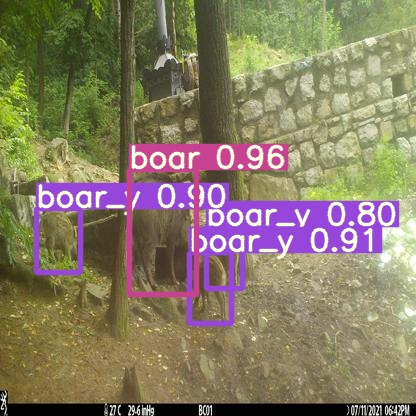

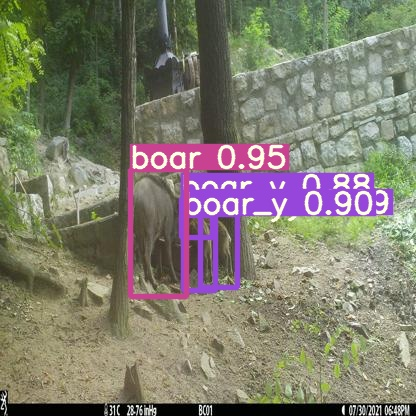

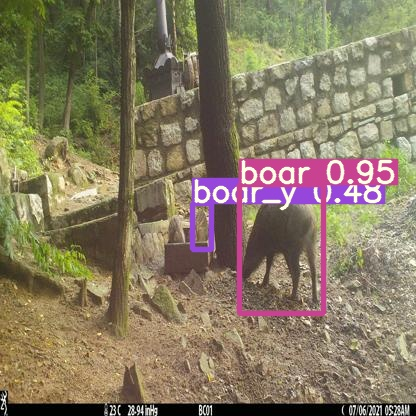

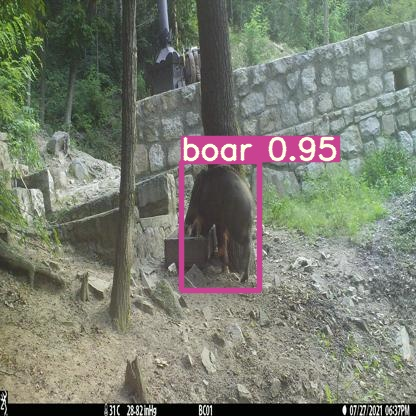

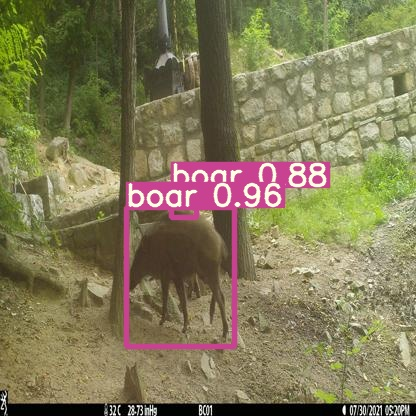

...

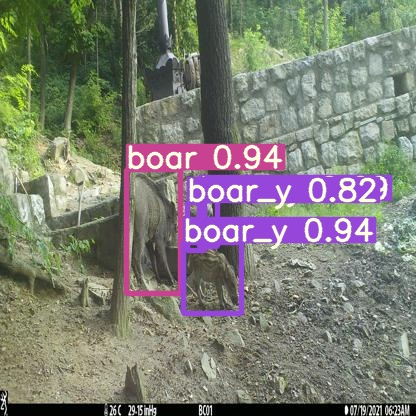

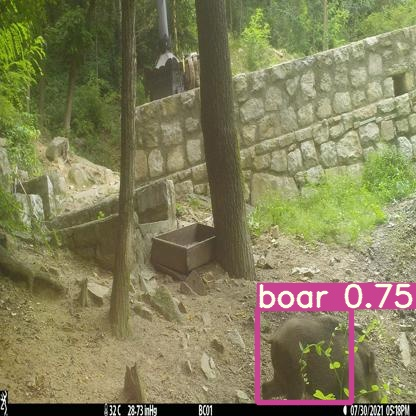

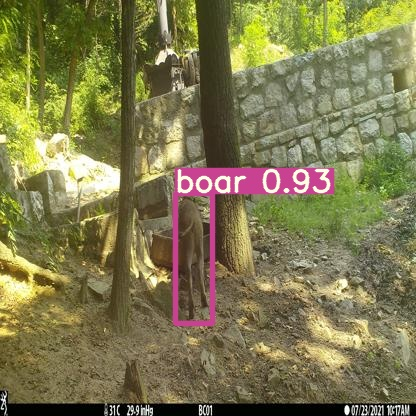

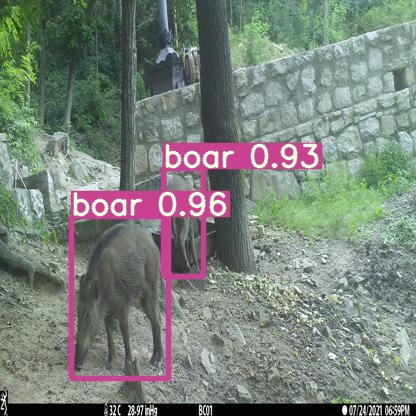

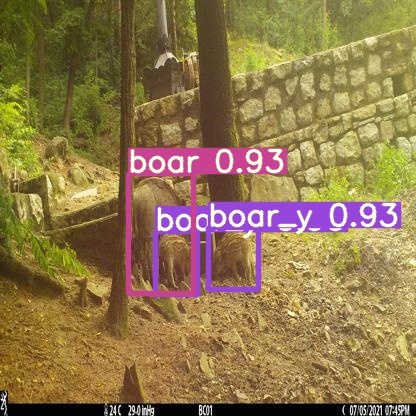

In [ ]:
#visualize the results

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.JPG'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
#zip Results
%cp /content/yolov5/Example2.xlsx /content/test3
!zip -r /content/res.zip /content/test3

  adding: content/test3/ (stored 0%)
  adding: content/test3/[a]IMG_2781.JPG6 1 boar, 2 boar_ys, .JPG (deflated 0%)
  adding: content/test3/[a]IMG_1742.JPG6 1 boar, 2 boar_ys, .JPG (deflated 0%)
  adding: content/test3/[a]IMG_0270.JPG6 1 boar, 1 boar_y, .JPG (deflated 0%)
  adding: content/test3/[a]IMG_3237.JPG6 1 boar, 1 boar_y, .JPG (deflated 0%)
  adding: content/test3/[a]IMG_2768.JPG6 1 boar, 1 boar_y, .JPG (deflated 0%)
  adding: content/test3/[a]IMG_2823.JPG6 2 boars, .JPG (deflated 1%)
  adding: content/test3/[a]IMG_0586.JPG6 1 boar, 1 boar_y, .JPG (deflated 0%)
  adding: content/test3/[a]IMG_1458.JPG6 1 boar, .JPG (deflated 0%)
  adding: content/test3/[a]IMG_0984.JPG6 2 boars, .JPG (deflated 0%)
  adding: content/test3/[a]IMG_0887.JPG6 1 boar, .JPG (deflated 0%)
  adding: content/test3/[a]IMG_1623.JPG6 2 boars, .JPG (deflated 0%)
  adding: content/test3/[a]IMG_2581.JPG6 1 boar, .JPG (deflated 0%)
  adding: content/test3/[a]IMG_2135.JPG6 2 boars, .JPG (deflated 0%)
  adding: con

In [ ]:
#Export res.zip to your google drive
%cp /content/res.zip "/content/drive/My Drive/YOLO"